# Music Genre Classification

In [1]:
from __future__ import print_function

In [2]:
# We'll need numpy for some mathematical operations
import numpy as np


# matplotlib for displaying the output
import matplotlib.pyplot as plt
import matplotlib.style as ms
ms.use('seaborn-muted')
%matplotlib inline


# and IPython.display for audio output
import IPython.display


# Librosa for audio
import librosa
# And the display module for visualization
import librosa.display
import glob
import os

import tensorflow as tf
from matplotlib.pyplot import specgram
from sklearn import preprocessing
from keras.utils.np_utils import to_categorical

Using TensorFlow backend.


## Mel spectrogram 

In [3]:
def show_mel_spectogram(audio_path):
    y, sr = librosa.load(audio_path)
    # Let's make and display a mel-scaled power (energy-squared) spectrogram
    S = librosa.feature.melspectrogram(y, sr=sr, n_mels=128)

    # Convert to log scale (dB). We'll use the peak power as reference.
    log_S = librosa.logamplitude(S, ref_power=np.max)

    # Make a new figure
    plt.figure(figsize=(12,4))

    # Display the spectrogram on a mel scale
    # sample rate and hop length parameters are used to render the time axis
    librosa.display.specshow(log_S, sr=sr, x_axis='time', y_axis='mel')

    # Put a descriptive title on the plot
    plt.title('mel power spectrogram')

    # draw a color bar
    plt.colorbar(format='%+02.0f dB')

    # Make the figure layout compact
    plt.tight_layout()
    plt.show()

## Harmonic-percussive source separation

In [4]:
def show_harmonic_percussive_separation(audio_path):
    y, sr = librosa.load(audio_path)
    y_harmonic, y_percussive = librosa.effects.hpss(y)
    # What do the spectrograms look like?
    # Let's make and display a mel-scaled power (energy-squared) spectrogram
    S_harmonic   = librosa.feature.melspectrogram(y_harmonic, sr=sr)
    S_percussive = librosa.feature.melspectrogram(y_percussive, sr=sr)

    # Convert to log scale (dB). We'll use the peak power as reference.
    log_Sh = librosa.logamplitude(S_harmonic, ref_power=np.max)
    log_Sp = librosa.logamplitude(S_percussive, ref_power=np.max)

    # Make a new figure
    plt.figure(figsize=(12,6))

    plt.subplot(2,1,1)
    # Display the spectrogram on a mel scale
    librosa.display.specshow(log_Sh, sr=sr, y_axis='mel')

    # Put a descriptive title on the plot
    plt.title('mel power spectrogram (Harmonic)')

    # draw a color bar
    plt.colorbar(format='%+02.0f dB')

    plt.subplot(2,1,2)
    librosa.display.specshow(log_Sp, sr=sr, x_axis='time', y_axis='mel')

    # Put a descriptive title on the plot
    plt.title('mel power spectrogram (Percussive)')

    # draw a color bar
    plt.colorbar(format='%+02.0f dB')

    # Make the figure layout compact
    plt.tight_layout()
    plt.show()

## Chromagram

Chroma features to represent pitch class information.

In [5]:
def show_pitch_chromagram(audio_path):    
    y, sr = librosa.load(audio_path)
    y_harmonic, y_percussive = librosa.effects.hpss(y)
    # We'll use a CQT-based chromagram here.  An STFT-based implementation also exists in chroma_cqt()
    # We'll use the harmonic component to avoid pollution from transients
    C = librosa.feature.chroma_cqt(y=y_harmonic, sr=sr)

    # Make a new figure
    plt.figure(figsize=(12,4))

    # Display the chromagram: the energy in each chromatic pitch class as a function of time
    # To make sure that the colors span the full range of chroma values, set vmin and vmax
    librosa.display.specshow(C, sr=sr, x_axis='time', y_axis='chroma', vmin=0, vmax=1)

    plt.title('Chromagram')
    plt.colorbar()

    plt.tight_layout()
    plt.show()

## MFCC

Mel-frequency cepstral coefficients are commonly used to represent texture or timbre of sound.

In [6]:
def show_mfcc_textures(audio_path):    
    y, sr = librosa.load(audio_path)
    # Let's make and display a mel-scaled power (energy-squared) spectrogram
    S = librosa.feature.melspectrogram(y, sr=sr, n_mels=128)
    # Convert to log scale (dB). We'll use the peak power as reference.
    log_S = librosa.logamplitude(S, ref_power=np.max)
    # Next, we'll extract the top 13 Mel-frequency cepstral coefficients (MFCCs)
    mfcc        = librosa.feature.mfcc(S=log_S, n_mfcc=13)

    # Let's pad on the first and second deltas while we're at it
    delta_mfcc  = librosa.feature.delta(mfcc)
    delta2_mfcc = librosa.feature.delta(mfcc, order=2)

    # How do they look?  We'll show each in its own subplot
    plt.figure(figsize=(12, 6))

    plt.subplot(3,1,1)
    librosa.display.specshow(mfcc)
    plt.ylabel('MFCC')
    plt.colorbar()

    plt.subplot(3,1,2)
    librosa.display.specshow(delta_mfcc)
    plt.ylabel('MFCC-$\Delta$')
    plt.colorbar()

    plt.subplot(3,1,3)
    librosa.display.specshow(delta2_mfcc, sr=sr, x_axis='time')
    plt.ylabel('MFCC-$\Delta^2$')
    plt.colorbar()

    plt.tight_layout()
    plt.show()

# Beat tracking

The beat tracker returns an estimate of the tempo (in beats per minute) and frame indices of beat events.

In [7]:
def show_beat_tracking(audio_path):
    y, sr = librosa.load(audio_path)
    y_harmonic, y_percussive = librosa.effects.hpss(y)
    # Now, let's run the beat tracker.
    # We'll use the percussive component for this part
    plt.figure(figsize=(12, 6))
    tempo, beats = librosa.beat.beat_track(y=y_percussive, sr=sr)
    # Let's make and display a mel-scaled power (energy-squared) spectrogram
    S = librosa.feature.melspectrogram(y, sr=sr, n_mels=128)
    # Convert to log scale (dB). We'll use the peak power as reference.
    log_S = librosa.logamplitude(S, ref_power=np.max)

    # Let's re-draw the spectrogram, but this time, overlay the detected beats
    plt.figure(figsize=(12,4))
    librosa.display.specshow(log_S, sr=sr, x_axis='time', y_axis='mel')

    # Let's draw transparent lines over the beat frames
    plt.vlines(librosa.frames_to_time(beats),
               1, 0.5 * sr,
               colors='w', linestyles='-', linewidth=2, alpha=0.5)

    plt.axis('tight')

    plt.colorbar(format='%+02.0f dB')

    plt.tight_layout()
    plt.show()
    print('Estimated tempo:        %.2f BPM' % tempo)
    print('First 5 beat frames:   ', beats[:5])
    # Frame numbers are great and all, but when do those beats occur?
    print('First 5 beat times:    ', librosa.frames_to_time(beats[:5], sr=sr))

## Beat-synchronous feature aggregation

Summarizes the feature content of each beat.

In [8]:
def show_beat_synchronous_feature_aggregation(audio_path):
    # feature.sync will summarize each beat event by the mean feature vector within that beat
    y, sr = librosa.load(audio_path)
    y_harmonic, y_percussive = librosa.effects.hpss(y)
    # Now, let's run the beat tracker.
    # We'll use the percussive component for this part
    plt.figure(figsize=(12, 6))
    tempo, beats = librosa.beat.beat_track(y=y_percussive, sr=sr)
    S = librosa.feature.melspectrogram(y, sr=sr, n_mels=128)
    # Convert to log scale (dB). We'll use the peak power as reference.
    log_S = librosa.logamplitude(S, ref_power=np.max)
    # Next, we'll extract the top 13 Mel-frequency cepstral coefficients (MFCCs)
    mfcc        = librosa.feature.mfcc(S=log_S, n_mfcc=13)
    # Let's pad on the first and second deltas while we're at it
    delta_mfcc  = librosa.feature.delta(mfcc)
    delta2_mfcc = librosa.feature.delta(mfcc, order=2)
    M = np.vstack([mfcc, delta_mfcc, delta2_mfcc])
    M_sync = librosa.util.sync(M, beats)

    plt.figure(figsize=(12,6))

    # Let's plot the original and beat-synchronous features against each other
    plt.subplot(2,1,1)
    librosa.display.specshow(M)
    plt.title('MFCC-$\Delta$-$\Delta^2$')

    # We can also use pyplot *ticks directly
    # Let's mark off the raw MFCC and the delta features
    plt.yticks(np.arange(0, M.shape[0], 13), ['MFCC', '$\Delta$', '$\Delta^2$'])

    plt.colorbar()

    plt.subplot(2,1,2)
    # librosa can generate axis ticks from arbitrary timestamps and beat events also
    librosa.display.specshow(M_sync, x_axis='time',
                             x_coords=librosa.frames_to_time(librosa.util.fix_frames(beats)))

    plt.yticks(np.arange(0, M_sync.shape[0], 13), ['MFCC', '$\Delta$', '$\Delta^2$'])             
    plt.title('Beat-synchronous MFCC-$\Delta$-$\Delta^2$')
    plt.colorbar()

    plt.tight_layout()
    plt.show()

## Extracting sound features

In [9]:
def extract_features(audio_path):
    y, sample_rate = librosa.load(audio_path)
    S = librosa.feature.melspectrogram(y, sr=sample_rate, n_mels=128)
    log_S = librosa.logamplitude(S, ref_power=np.max)
    y_harmonic, y_percussive = librosa.effects.hpss(y)
    tempo_bpm, beats = librosa.beat.beat_track(y=y_percussive, sr=sample_rate)
    stft = np.abs(librosa.stft(y))
    mfcc        = librosa.feature.mfcc(y=y, sr=sample_rate, n_mfcc=40)
    mfccs = np.mean(mfcc.T,axis=0)
    chroma_stft = np.mean(librosa.feature.chroma_stft(S=stft, sr=sample_rate).T,axis=0)
    mel = np.mean(librosa.feature.melspectrogram(y, sr=sample_rate).T,axis=0)
    contrast = np.mean(librosa.feature.spectral_contrast(S=stft, sr=sample_rate).T,axis=0)
    tonnetz = np.mean(librosa.feature.tonnetz(y=y_harmonic,sr=sample_rate).T,axis=0)
    #print(len(mfccs))
    #print(len(chroma_stft))
    #print(len(mel))
    #print(len(contrast))
    #print(len(tonnetz))
    return mfccs, chroma_stft, mel,contrast,tonnetz, tempo_bpm

### Loading audio from directory

In [10]:
def windows(data, window_size):
    start = 0
    while start < len(data):
        yield start, start + window_size
        start += (window_size / 2)

    
def parse_audio_files_for_cnn(parent_dir,sub_dirs,max_number=100, file_ext="*.wav", bands = 60, frames = 41):
    window_size = 512 * (frames - 1)
    log_specgrams = []
    
    labels = []
    for label, sub_dir in enumerate(sub_dirs):
        for fn in glob.glob(os.path.join(parent_dir, sub_dir, file_ext)):
            sound_clip, sample_rate = librosa.load(fn)
            label = fn.split('/')[2].split('.')[0] #<path>/<label>.<number>.wav
            number = fn.split('/')[2].split('.')[1]            
            if int(number) <= max_number:
                print("label {} number {}".format(label, number))
                try:
                    for (start,end) in windows(sound_clip,window_size):
                        if(len(sound_clip[start:end]) == window_size):
                            signal = sound_clip[start:end]
                            #extract features from window
                            melspec = librosa.feature.melspectrogram(signal, n_mels = bands)
                            logspec = librosa.logamplitude(melspec)

                            #append to array (first add new axis)
                            logspec = logspec.T.flatten()[:, np.newaxis].T
                            log_specgrams.append(logspec)
                            labels.append(label)
                except Exception as e:
                    print("Error {} encountered while parsing file: {}".format(e,fn))
                    continue
    
    #reshape to tensor
    log_specgrams = np.asarray(log_specgrams).reshape(len(log_specgrams),bands,frames,1)
   
    #adding channels of features
    features = np.concatenate((log_specgrams, np.zeros(np.shape(log_specgrams))), axis = 3)
    #adding delta of features
    for i in range(len(features)):
        features[i, :, :, 1] = librosa.feature.delta(features[i, :, :, 0])
    print("features size {}".format(np.array(features).shape))
    print("labels size {}".format(np.array(labels).shape))
    return np.array(features), np.array(labels)

In [ ]:
parent_dir = "gtzan"
sub_dirs = ["wav"]
features, labels = parse_audio_files_for_cnn(parent_dir,sub_dirs, max_number=5)

In [ ]:
## ML Preprocessing

In [ ]:
le = preprocessing.LabelEncoder()
le.fit(labels)
print(list(le.classes_))
labels_encoded = le.transform(labels) 
print(labels_encoded)

# CNN training

A stacked convolutional neural network (CNN) to classify dataset. Uses Tensorflow, with Keras to provide some 

### Separar os dados (treino, validação e teste) 
60% para treino e 40% para testes.

Dos 60% de treino (deixar 80% para treino e 20% para validaçao)

In [ ]:
from sklearn.model_selection import train_test_split
X = features
y = labels_encoded

X_train, test_x, y_train, test_y = train_test_split(X, y, test_size=0.4)
train_x, valid_x, train_y, valid_y = train_test_split(X_train, y_train, test_size=0.2)

train_y = train_y.reshape((-1, 1))
valid_y = valid_y.reshape((-1, 1))
test_y = test_y.reshape((-1, 1))

print("TRAIN x size {} y size {}".format(train_x.shape, train_y.shape))
print("VALIDATION x size {} y size {}".format(valid_x.shape, valid_y.shape))
print("TEST x size {} y size {}".format(test_x.shape, test_y.shape))

#print("TEST y {}".format(test_y))

### Create CNN Architecture

In [11]:
import numpy as np
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation, Flatten
from keras.layers import Convolution2D, MaxPooling2D
from keras.wrappers.scikit_learn import KerasClassifier
from keras.callbacks import ModelCheckpoint, TensorBoard, RemoteMonitor, EarlyStopping
from keras.optimizers import Adam
from keras.utils import np_utils
from sklearn import metrics 
from sklearn.model_selection import GridSearchCV
from sklearn.cross_validation import StratifiedShuffleSplit
from keras import backend as K
from tensorflow.python.ops import control_flow_ops
import tensorflow as tf
from keras.optimizers import SGD
from keras.regularizers import l2, activity_l2
from keras.utils import np_utils
from sklearn import metrics 
tf.python.control_flow_ops = tf
K.set_image_dim_ordering('tf')

# data dimension parameters 
frames = 41
bands = 60
num_channels = 2
num_labels = 10
def create_model():
    # this model implements the 5 layer CNN described in https://arxiv.org/pdf/1608.04363.pdf
    # be aware, there are 2 main differences: 
    # the input is 60x41 data frames with 2 channels => (60,41,2) tensors 
    # the paper seems to report using 128x128 data frames (with no mention of channels)
    # the paper also uses a receptive field size of 3x3 
    f_size = 3

    model = Sequential()

    # Layer 1 - 24 filters with a receptive field of (f,f), i.e. W has the shape (24,1,f,f). 
    # This is followed by (4,2) max-pooling over the last two dimensions and a ReLU activation function.
    model.add(Convolution2D(24, f_size, f_size, border_mode='same', input_shape=(bands, frames, num_channels)))
    model.add(MaxPooling2D(pool_size=(4, 2)))
    model.add(Activation('relu'))

    # Layer 2 - 48 filters with a receptive field of (f,f), i.e. W has the shape (48,24,f,f). 
    # Like L1 this is followed by (4,2) max-pooling and a ReLU activation function.
    model.add(Convolution2D(48, f_size, f_size, border_mode='same'))
    model.add(MaxPooling2D(pool_size=(4, 2)))
    model.add(Activation('relu'))

    # Layer 3 - 48 filters with a receptive field of (f,f), i.e. W has the shape (48, 48, f, f). 
    # This is followed by a ReLU but no pooling.
    model.add(Convolution2D(48, f_size, f_size, border_mode='valid'))
    model.add(Activation('relu'))

    # flatten output into a single dimension, let Keras do shape inference
    model.add(Flatten())

    # Layer 4 - a fully connected NN layer of 64 hidden units, L2 penalty of 0.001
    model.add(Dense(64, W_regularizer=l2(0.001)))
    model.add(Activation('relu'))
    model.add(Dropout(0.5))

    # Layer 5 - an output layer with one output unit per class, with L2 penalty, 
    # followed by a softmax activation function
    model.add(Dense(num_labels, W_regularizer=l2(0.001)))
    model.add(Dropout(0.5))
    model.add(Activation('softmax'))


    # create a SGD optimiser
    sgd = SGD(lr=0.001, momentum=0.9, decay=1e-6, nesterov=True)

    tensorboard = TensorBoard(log_dir='/home/paulofaria/music_genre_classification/tensorflow/logs', write_graph=True)
    checkpointer = ModelCheckpoint(filepath='/home/paulofaria/music_genre_classification/tensorflow/tmp/weigths_mir_classifier.hdf5', verbose=1, save_best_only=True)
    remote = RemoteMonitor(root='http://localhost:9001')
    earlystop = EarlyStopping(monitor="val_loss", patience=30, verbose=0)
    # now compile the model, Keras will take care of the Tensorflow/Theano boilerplate
    model.compile(loss='sparse_categorical_crossentropy', metrics=['accuracy'], optimizer=sgd, callbacks=[remote,earlystop,checkpointer,tensorboard])
    return model

/home/paulofaria/anaconda2/lib/python2.7/site-packages/sklearn/cross_validation.py:44: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


#### Select best model (using Validation)

In [ ]:
model = KerasClassifier(build_fn=create_model,verbose=0)
nb_epochs_range = np.linspace(40, 50, num=2, dtype=int)
batch_size_range = np.logspace(5.0, 6.0, base=2, num=2, dtype=int)
param_grid = dict(nb_epoch=nb_epochs_range, batch_size=batch_size_range)
validation = StratifiedShuffleSplit(train_y, n_iter=1, test_size=0.2)
grid = GridSearchCV(estimator=model, param_grid=param_grid, cv=validation)
%timeit grid_result = grid.fit(train_x, train_y)

print("Os melhores parametros para Cnn params %s com um score de %0.2f"
     % (grid.best_params_, grid.best_score_))        


### Train best model

In [12]:
from sklearn.model_selection import train_test_split


parent_dir = "gtzan"
sub_dirs = ["wav"]
features, labels = parse_audio_files_for_cnn(parent_dir,sub_dirs, max_number=100)

le = preprocessing.LabelEncoder()
le.fit(labels)
print(list(le.classes_))
labels_encoded = le.transform(labels) 
print(labels_encoded)

X = features
y = labels_encoded

X_train, test_x, y_train, test_y = train_test_split(X, y, test_size=0.2)
train_x, valid_x, train_y, valid_y = train_test_split(X_train, y_train, test_size=0.2)

train_y = train_y.reshape((-1, 1))
valid_y = valid_y.reshape((-1, 1))
test_y = test_y.reshape((-1, 1))

print("TRAIN x size {} y size {}".format(train_x.shape, train_y.shape))
print("VALIDATION x size {} y size {}".format(valid_x.shape, valid_y.shape))
print("TEST x size {} y size {}".format(test_x.shape, test_y.shape))
model = create_model()
%timeit model.fit(train_x, train_y, validation_data=(valid_x, valid_y), batch_size=32, nb_epoch=50, verbose=0)

label hiphop number 00003
label hiphop number 00069
label hiphop number 00015
label hiphop number 00053
label hiphop number 00031
label hiphop number 00011
label hiphop number 00010
label hiphop number 00056
label hiphop number 00080
label hiphop number 00049
label hiphop number 00017
label hiphop number 00084
label hiphop number 00021
label hiphop number 00005
label hiphop number 00097
label hiphop number 00037
label hiphop number 00033
label hiphop number 00012
label hiphop number 00078
label hiphop number 00040
label hiphop number 00023
label hiphop number 00082
label hiphop number 00036
label hiphop number 00007
label hiphop number 00038
label hiphop number 00041
label hiphop number 00072
label hiphop number 00050
label hiphop number 00066
label hiphop number 00039
label hiphop number 00059
label hiphop number 00029
label hiphop number 00061
label hiphop number 00095
label hiphop number 00096
label hiphop number 00034
label hiphop number 00089
label hiphop number 00000
label hiphop

/home/paulofaria/anaconda2/lib/python2.7/site-packages/keras/backend/tensorflow_backend.py:1960: UserWarning: Expected no kwargs, you passed 1
kwargs passed to function are ignored with Tensorflow backend
  warnings.warn('\n'.join(msg))



TEST x size (12607, 60, 41, 2) y size (12607, 1)
1 loop, best of 3: 31min 15s per loop


## Evaluate model on test

In [13]:
# finally, evaluate the model using the withheld test dataset
score, accuracy = model.evaluate(test_x, test_y, batch_size=32)
print("\nAccuracy = {:.2f}".format(accuracy))

12607/12607 [==============================] - 4s      

In [14]:
predictions = model.predict_classes(test_x)
print(predictions)
print("Predictions {}".format(predictions))

12480/12607 [============================>.] - ETA: 0s  

In [36]:
from sklearn.metrics import confusion_matrix
y_pred = predictions
print(test_y[:,0])
print(le.classes_)
y_true = test_y[:,0]
confusion_matrix(y_true, y_pred)

[0 7 5 ..., 4 5 4]
['blues' 'classical' 'country' 'disco' 'hiphop' 'jazz' 'metal' 'pop'
 'reggae' 'rock']


array([[ 966,    7,   93,   35,    8,   50,    3,    2,   24,   88],
       [   4, 1105,   10,    1,    5,   27,    1,    7,    2,    7],
       [  61,   12,  798,   42,   21,   63,    8,   55,   49,  144],
       [  40,    9,   29,  898,   63,    6,   10,   63,   37,   95],
       [  35,    2,   20,   75,  886,    2,   26,  101,   62,   73],
       [  42,   68,   73,   12,    3,  981,    0,   22,   18,   55],
       [  22,    0,   10,   22,   23,    9,  933,    2,    3,  161],
       [   1,    6,   24,   55,   49,   17,    0, 1090,   39,   43],
       [  27,    3,   47,   90,  153,   25,    3,   70,  832,   56],
       [  64,    7,  100,  116,   40,   36,   29,   71,   37,  788]])

### Predict one sample

In [15]:
def predict(audio_path, bands = 60, frames = 41):
    window_size = 512 * (frames - 1)
    log_specgrams = []    
    labels = []    
    sound_clip, sample_rate = librosa.load(audio_path)
    label = audio_path.split('/')[2].split('.')[0] #<path>/<label>.<number>.wav
    number = audio_path.split('/')[2].split('.')[1]            
    print("label {} number {}".format(label, number))
    try:
        for (start,end) in windows(sound_clip,window_size):
            if(len(sound_clip[start:end]) == window_size):
                signal = sound_clip[start:end]
                #extract features from window
                melspec = librosa.feature.melspectrogram(signal, n_mels = bands)
                logspec = librosa.logamplitude(melspec)

                #append to array (first add new axis)
                logspec = logspec.T.flatten()[:, np.newaxis].T
                log_specgrams.append(logspec)
                labels.append(label)
    except Exception as e:
        print("Error {} encountered while parsing file: {}".format(e,audio_path))
    
    #reshape to tensor
    log_specgrams = np.asarray(log_specgrams).reshape(len(log_specgrams),bands,frames,1)
   
    #adding channels of features
    features = np.concatenate((log_specgrams, np.zeros(np.shape(log_specgrams))), axis = 3)
    #adding delta of features
    for i in range(len(features)):
        features[i, :, :, 1] = librosa.feature.delta(features[i, :, :, 0])
    print("features size {}".format(np.array(features).shape))
    print("labels size {}".format(np.array(labels).shape))    
    prediction = model.predict_classes(np.array(features))
    print("Prediction Value {}".format(prediction))    
    import collections
    c1 = collections.Counter(prediction)
    print(list(le.classes_))
    print("Counter Elements {}".format(c1))

## Blues Sample 

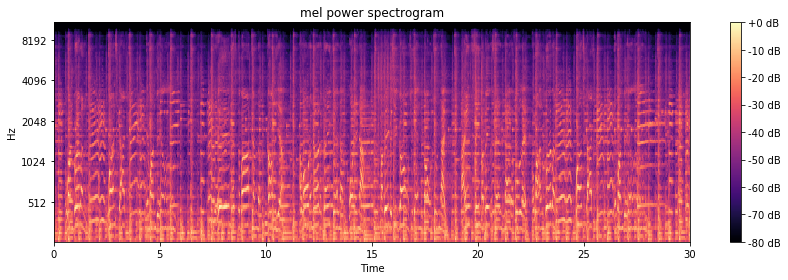

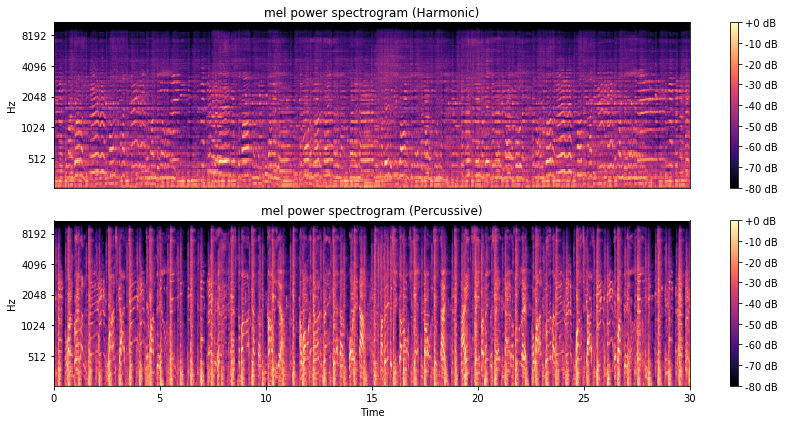

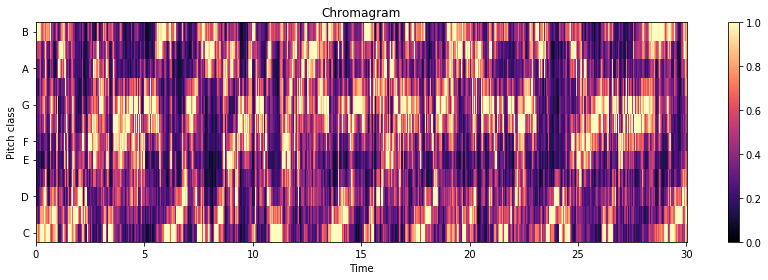

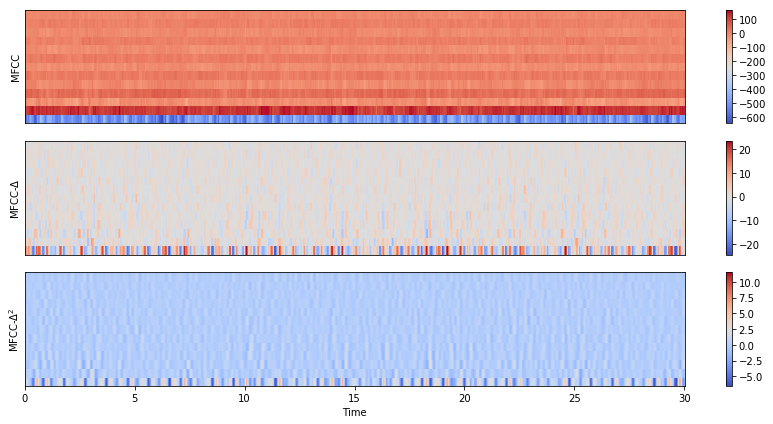

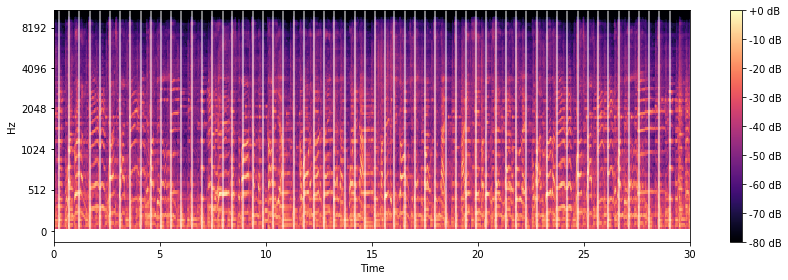

Estimated tempo:        123.05 BPM
First 5 beat frames:    [11 31 52 73 94]
First 5 beat times:     [ 0.2554195   0.71981859  1.20743764  1.69505669  2.18267574]
label blues number 00000
features size (63, 60, 41, 2)
labels size (63,)
32/63 [==============>...............] - ETA: 0sPrediction Value [0 0 0 2 0 3 9 0 2 0 0 0 0 9 9 0 2 0 2 0 0 9 0 0 0 0 0 0 0 0 9 2 0 3 9 0 3
 0 0 9 9 9 9 0 0 2 0 0 3 0 2 2 0 0 0 9 0 0 0 2 2 0 0]
['blues', 'classical', 'country', 'disco', 'hiphop', 'jazz', 'metal', 'pop', 'reggae', 'rock']
Counter Elements Counter({0: 38, 9: 11, 2: 10, 3: 4})


In [16]:
audio_path = 'gtzan/wav/blues.00000.wav'
show_mel_spectogram(audio_path)
show_harmonic_percussive_separation(audio_path)
show_pitch_chromagram(audio_path)
show_mfcc_textures(audio_path)
show_beat_tracking(audio_path)
#show_beat_synchronous_feature_aggregation(audio_path)
extract_features(audio_path)
predict(audio_path)

## Classical Sample 

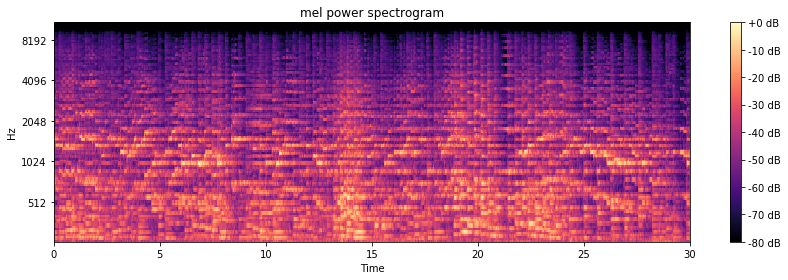

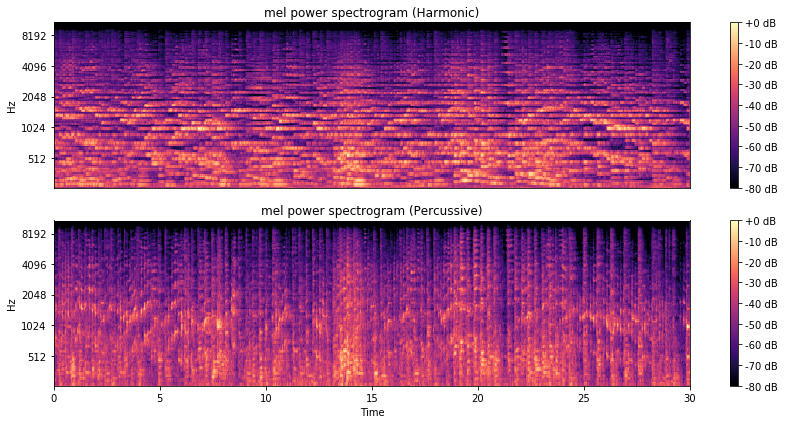

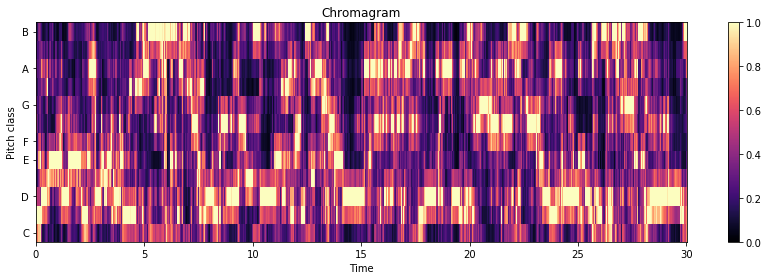

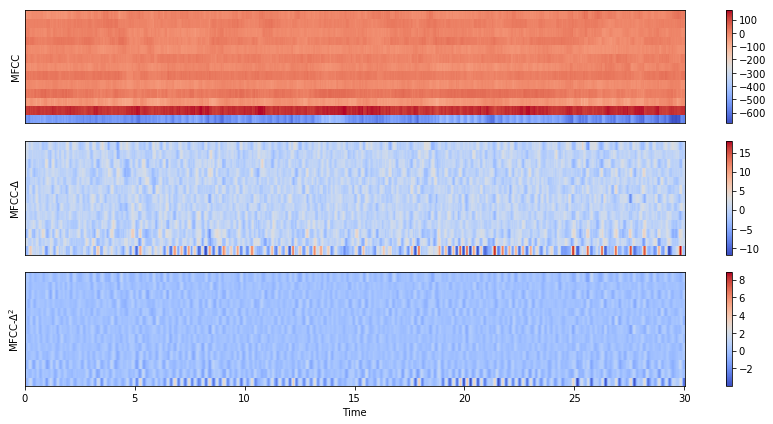

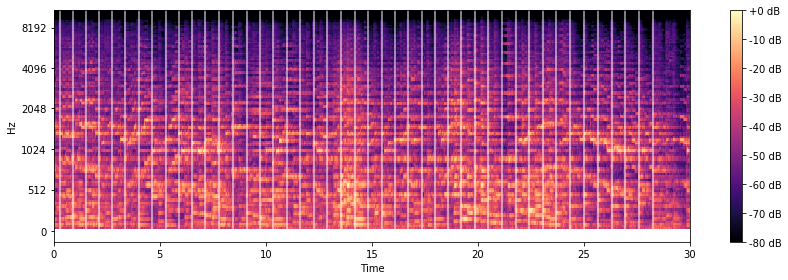

Estimated tempo:        95.70 BPM
First 5 beat frames:    [ 12  39  65  92 119]
First 5 beat times:     [ 0.27863946  0.90557823  1.50929705  2.13623583  2.7631746 ]
label classical number 00000
features size (63, 60, 41, 2)
labels size (63,)
32/63 [==============>...............] - ETA: 0sPrediction Value [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
['blues', 'classical', 'country', 'disco', 'hiphop', 'jazz', 'metal', 'pop', 'reggae', 'rock']
Counter Elements Counter({1: 63})


In [17]:
audio_path = 'gtzan/wav/classical.00000.wav'
show_mel_spectogram(audio_path)
show_harmonic_percussive_separation(audio_path)
show_pitch_chromagram(audio_path)
show_mfcc_textures(audio_path)
show_beat_tracking(audio_path)
predict(audio_path)

## Country Sample 

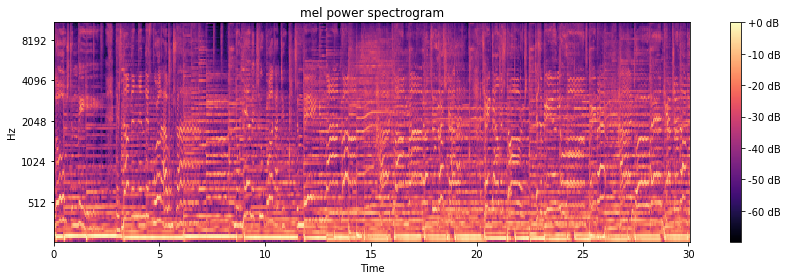

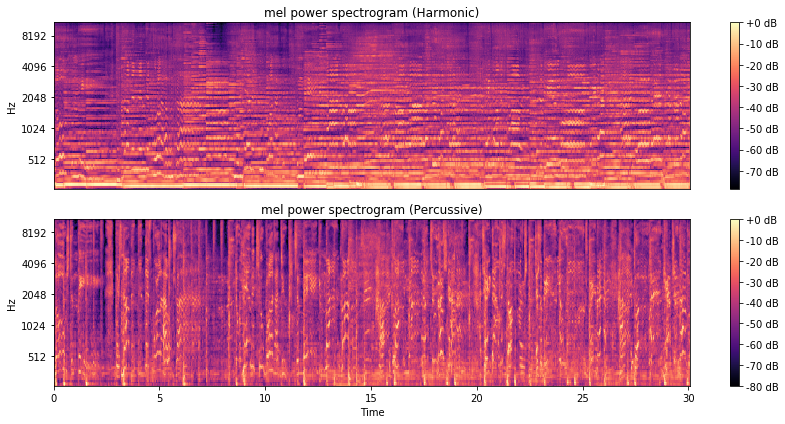

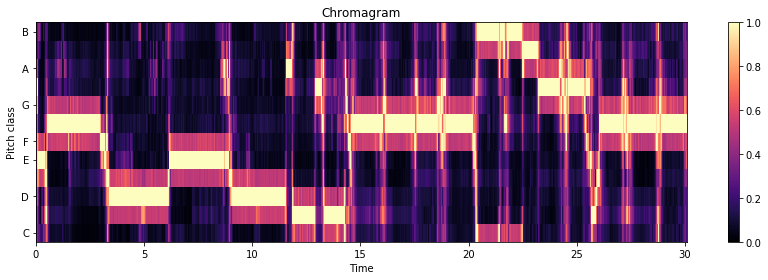

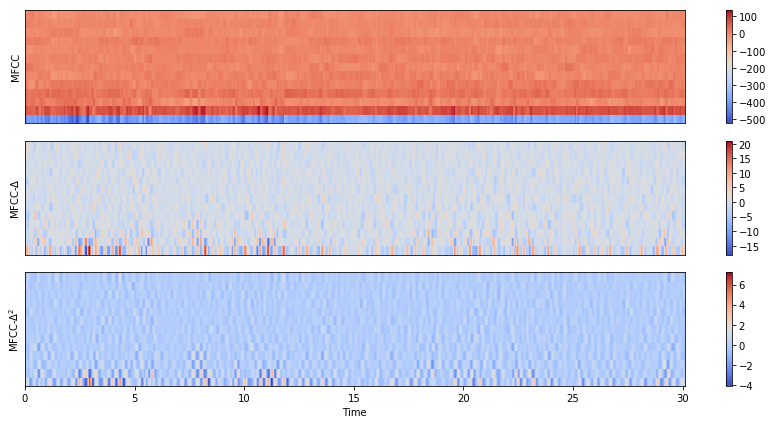

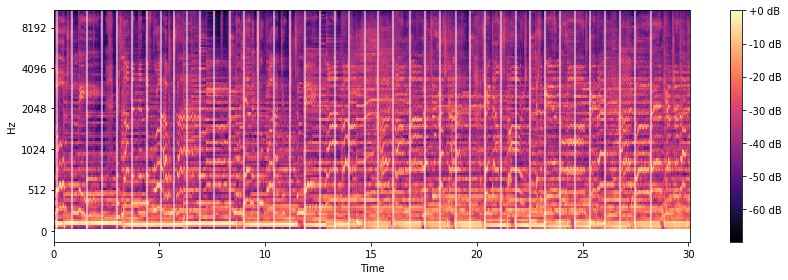

Estimated tempo:        86.13 BPM
First 5 beat frames:    [  6  37  67  98 128]
First 5 beat times:     [ 0.13931973  0.85913832  1.55573696  2.27555556  2.9721542 ]
label country number 00000
features size (63, 60, 41, 2)
labels size (63,)
32/63 [==============>...............] - ETA: 0sPrediction Value [5 2 2 2 5 2 2 2 2 2 2 9 2 2 2 2 2 2 2 2 2 2 2 2 2 3 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2]
['blues', 'classical', 'country', 'disco', 'hiphop', 'jazz', 'metal', 'pop', 'reggae', 'rock']
Counter Elements Counter({2: 59, 5: 2, 9: 1, 3: 1})


In [18]:
audio_path = 'gtzan/wav/country.00000.wav'
show_mel_spectogram(audio_path)
show_harmonic_percussive_separation(audio_path)
show_pitch_chromagram(audio_path)
show_mfcc_textures(audio_path)
show_beat_tracking(audio_path)
predict(audio_path)

## Disco Sample 

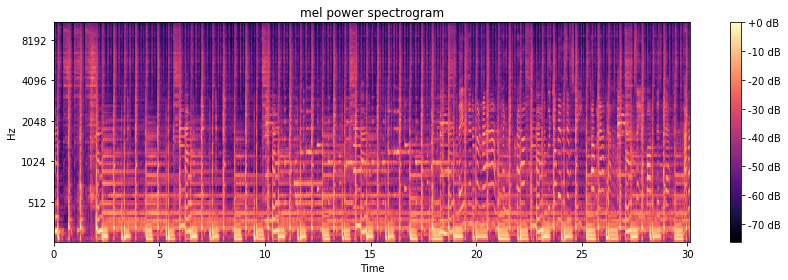

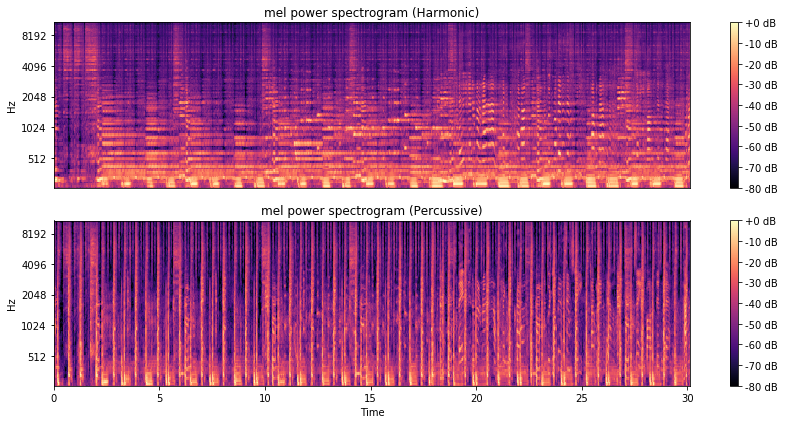

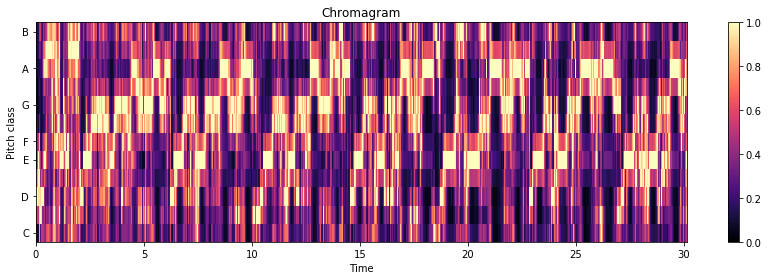

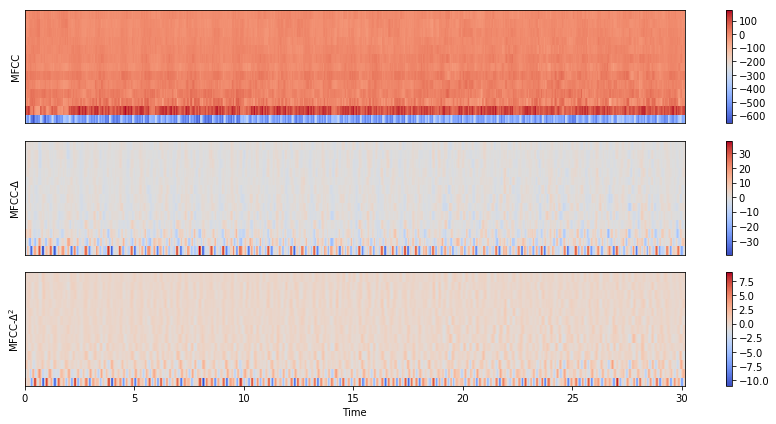

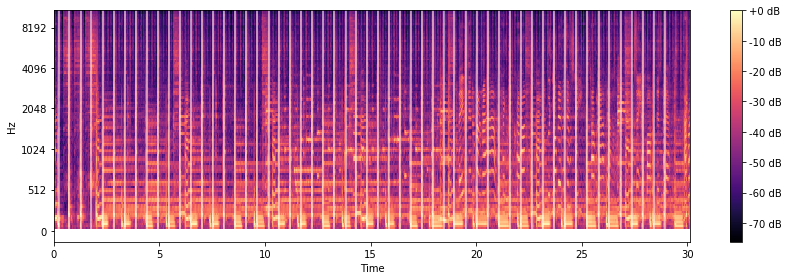

Estimated tempo:        117.45 BPM
First 5 beat frames:    [ 10  32  55  77 100]
First 5 beat times:     [ 0.23219955  0.74303855  1.27709751  1.78793651  2.32199546]
label disco number 00000
features size (63, 60, 41, 2)
labels size (63,)
32/63 [==============>...............] - ETA: 0sPrediction Value [3 3 3 3 3 3 3 3 3 3 3 4 3 3 3 3 4 3 3 3 4 3 3 9 3 3 3 3 4 3 3 3 4 3 3 3 3
 3 4 3 3 3 3 3 3 3 4 4 3 3 4 8 3 3 3 3 4 8 3 4 3 3 3]
['blues', 'classical', 'country', 'disco', 'hiphop', 'jazz', 'metal', 'pop', 'reggae', 'rock']
Counter Elements Counter({3: 49, 4: 11, 8: 2, 9: 1})


In [19]:
audio_path = 'gtzan/wav/disco.00000.wav'
show_mel_spectogram(audio_path)
show_harmonic_percussive_separation(audio_path)
show_pitch_chromagram(audio_path)
show_mfcc_textures(audio_path)
show_beat_tracking(audio_path)
predict(audio_path)

## HipHop Sample 

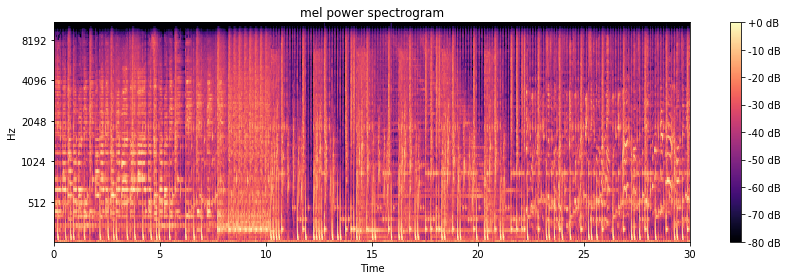

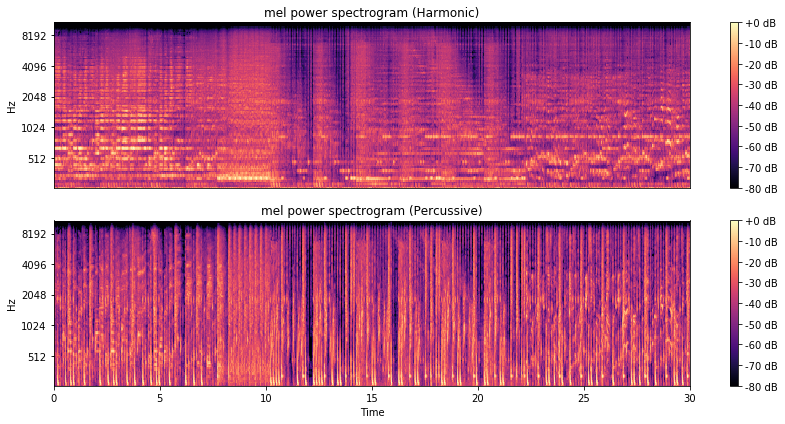

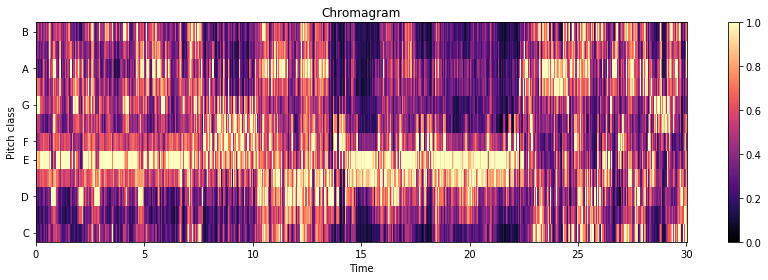

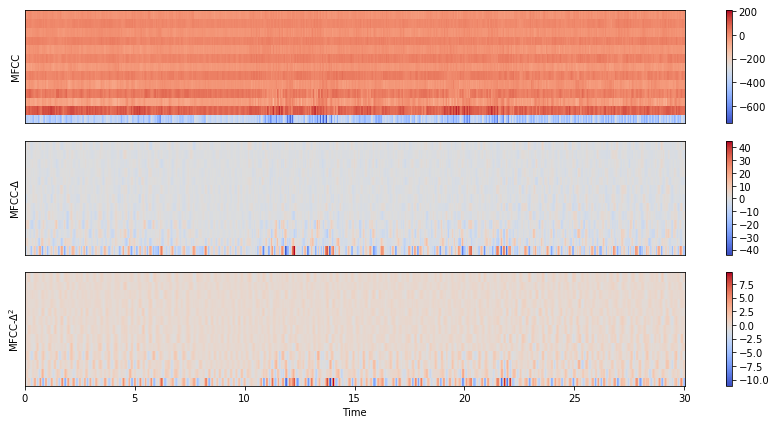

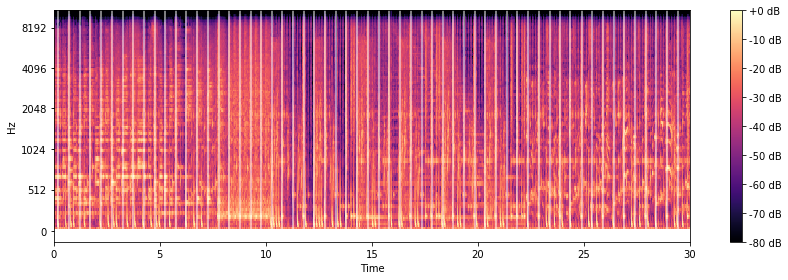

Estimated tempo:        117.45 BPM
First 5 beat frames:    [ 9 31 53 74 96]
First 5 beat times:     [ 0.20897959  0.71981859  1.2306576   1.71827664  2.22911565]
label hiphop number 00000
features size (63, 60, 41, 2)
labels size (63,)
32/63 [==============>...............] - ETA: 0sPrediction Value [4 9 0 4 4 4 4 4 4 4 4 4 0 4 6 4 9 9 9 6 9 6 4 4 4 4 4 4 4 4 6 6 4 4 3 4 4
 4 3 4 4 3 4 3 4 4 9 3 4 4 3 3 3 4 4 4 3 4 4 4 4 4 3]
['blues', 'classical', 'country', 'disco', 'hiphop', 'jazz', 'metal', 'pop', 'reggae', 'rock']
Counter Elements Counter({4: 40, 3: 10, 9: 6, 6: 5, 0: 2})


In [20]:
audio_path = 'gtzan/wav/hiphop.00000.wav'
show_mel_spectogram(audio_path)
show_harmonic_percussive_separation(audio_path)
show_pitch_chromagram(audio_path)
show_mfcc_textures(audio_path)
show_beat_tracking(audio_path)
predict(audio_path)

## Jazz Sample

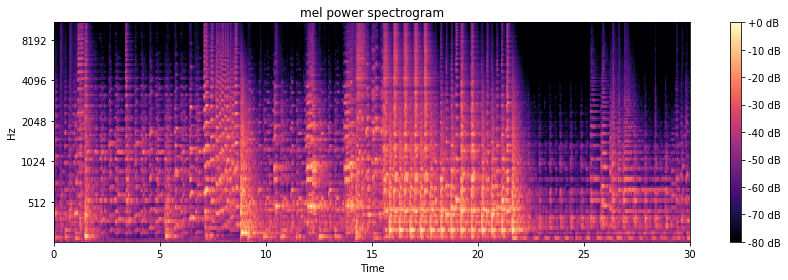

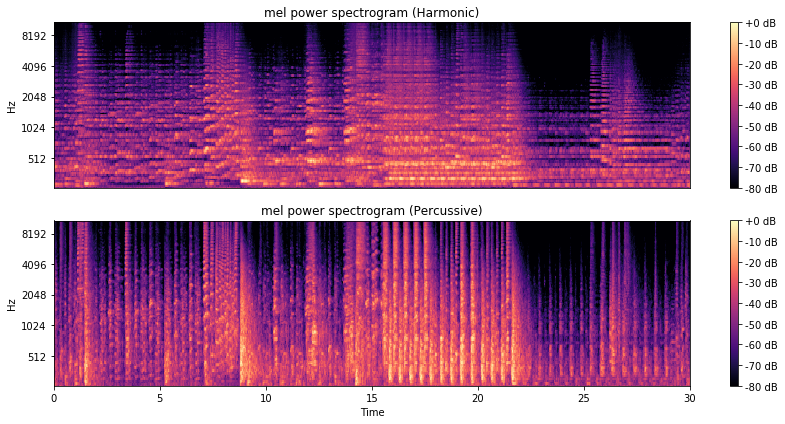

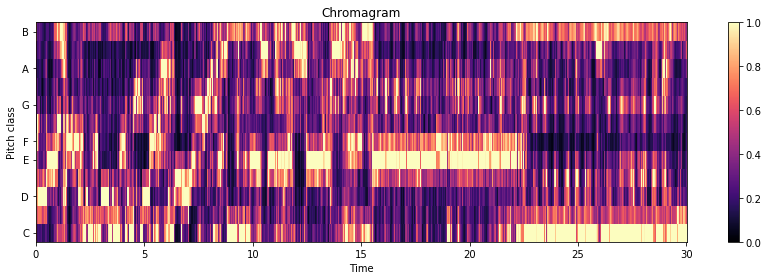

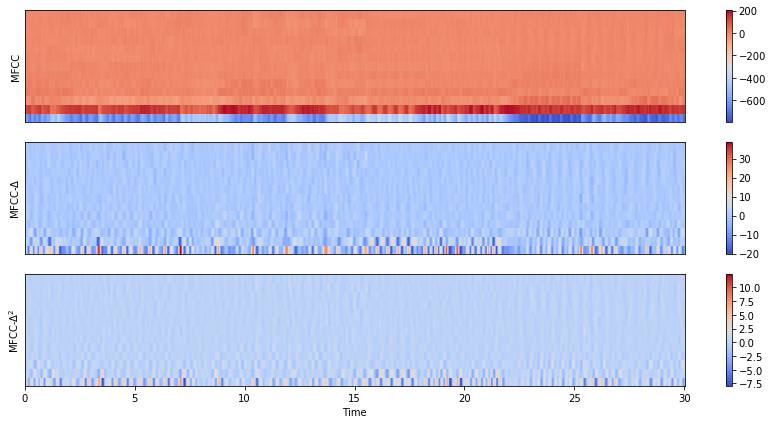

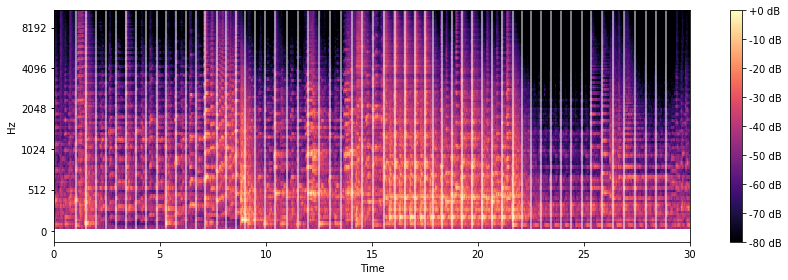

Estimated tempo:        123.05 BPM
First 5 beat frames:    [ 45  65  86 106 127]
First 5 beat times:     [ 1.04489796  1.50929705  1.9969161   2.46131519  2.94893424]
label jazz number 00000
features size (63, 60, 41, 2)
labels size (63,)
32/63 [==============>...............] - ETA: 0sPrediction Value [1 9 5 2 1 1 1 2 1 1 1 1 1 1 5 1 5 1 1 1 1 1 1 1 1 1 7 1 5 1 7 5 5 1 9 9 5
 5 5 1 9 9 5 5 5 5 5 5 5 1 1 5 5 1 1 1 5 1 1 1 1 1 5]
['blues', 'classical', 'country', 'disco', 'hiphop', 'jazz', 'metal', 'pop', 'reggae', 'rock']
Counter Elements Counter({1: 34, 5: 20, 9: 5, 2: 2, 7: 2})


In [21]:
audio_path = 'gtzan/wav/jazz.00000.wav'
show_mel_spectogram(audio_path)
show_harmonic_percussive_separation(audio_path)
show_pitch_chromagram(audio_path)
show_mfcc_textures(audio_path)
show_beat_tracking(audio_path)
predict(audio_path)

## Metal Sample

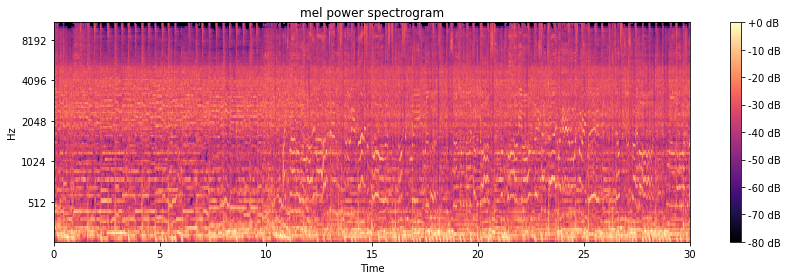

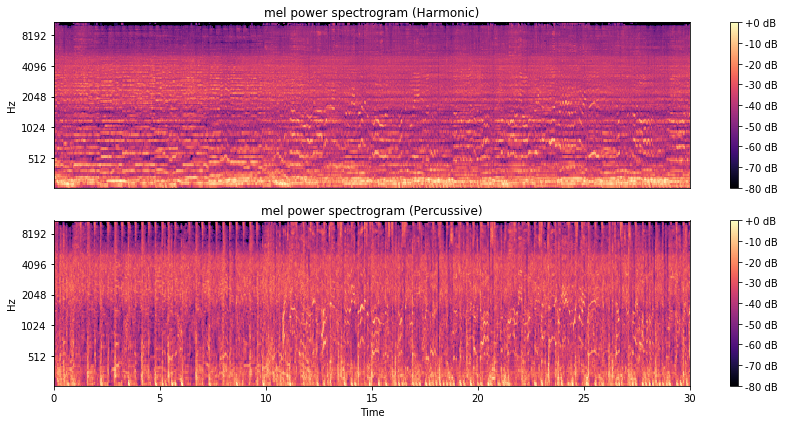

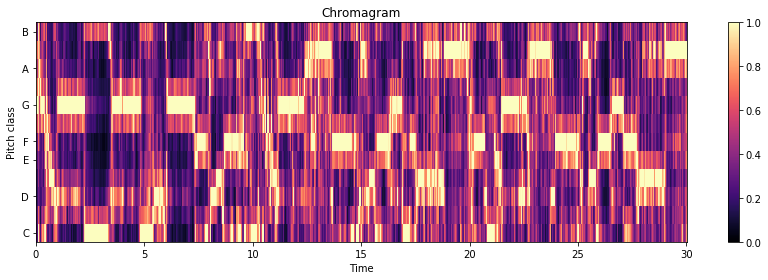

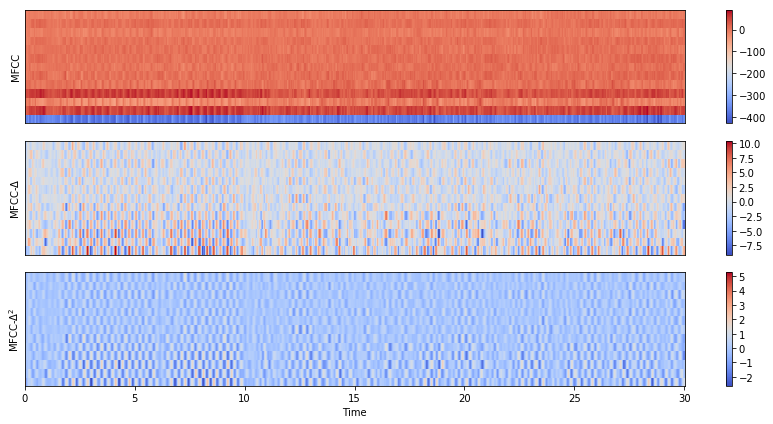

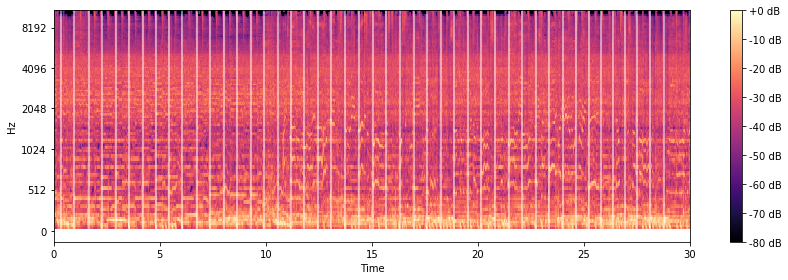

Estimated tempo:        95.70 BPM
First 5 beat frames:    [ 14  42  71  98 126]
First 5 beat times:     [ 0.32507937  0.9752381   1.64861678  2.27555556  2.92571429]
label metal number 00000
features size (63, 60, 41, 2)
labels size (63,)
32/63 [==============>...............] - ETA: 0sPrediction Value [6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 5 6 6 6 6 6 6 3 6 4 6 6
 6 4 6 6 6 6 6 6 6 9 5 6 6 6 6 9 6 6 6 6 6 6 6 6 6 6]
['blues', 'classical', 'country', 'disco', 'hiphop', 'jazz', 'metal', 'pop', 'reggae', 'rock']
Counter Elements Counter({6: 56, 9: 2, 4: 2, 5: 2, 3: 1})


In [22]:
audio_path = 'gtzan/wav/metal.00000.wav'
show_mel_spectogram(audio_path)
show_harmonic_percussive_separation(audio_path)
show_pitch_chromagram(audio_path)
show_mfcc_textures(audio_path)
show_beat_tracking(audio_path)
predict(audio_path)

## Pop Sample

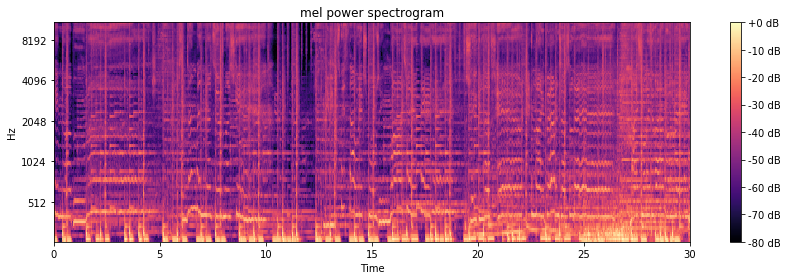

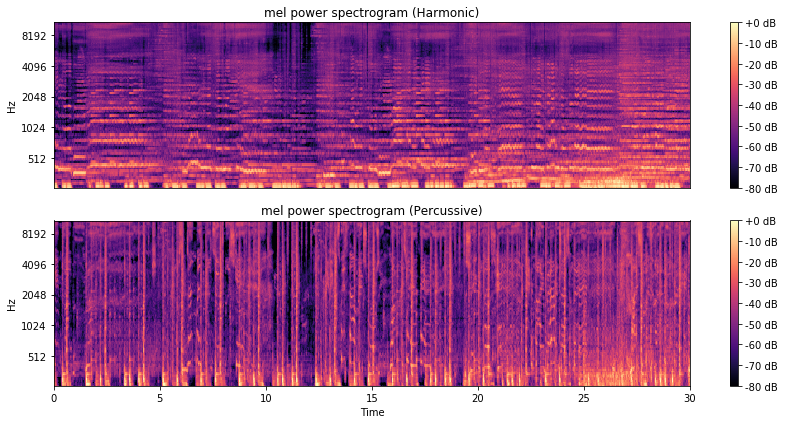

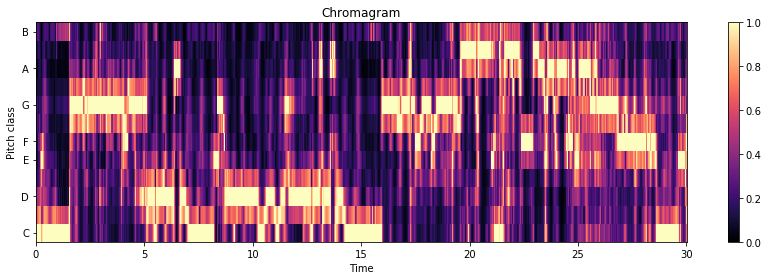

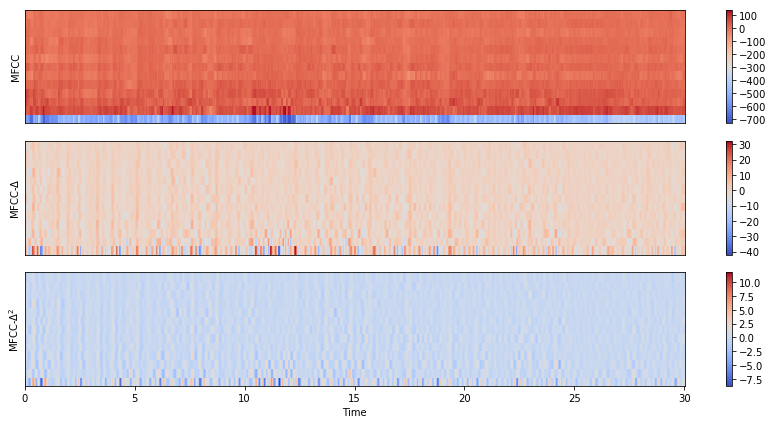

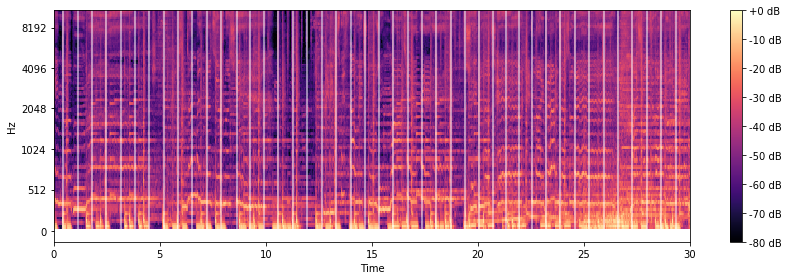

Estimated tempo:        89.10 BPM
First 5 beat frames:    [ 19  50  78 106 136]
First 5 beat times:     [ 0.44117914  1.16099773  1.81115646  2.46131519  3.15791383]
label pop number 00000
features size (63, 60, 41, 2)
labels size (63,)
32/63 [==============>...............] - ETA: 0sPrediction Value [7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 3 3 7 7 7 7 7 7 7 7 7 7 7 7
 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 4 7 7 7 7 7 7]
['blues', 'classical', 'country', 'disco', 'hiphop', 'jazz', 'metal', 'pop', 'reggae', 'rock']
Counter Elements Counter({7: 60, 3: 2, 4: 1})


In [23]:
audio_path = 'gtzan/wav/pop.00000.wav'
show_mel_spectogram(audio_path)
show_harmonic_percussive_separation(audio_path)
show_pitch_chromagram(audio_path)
show_mfcc_textures(audio_path)
show_beat_tracking(audio_path)
predict(audio_path)

## Reggae Sample

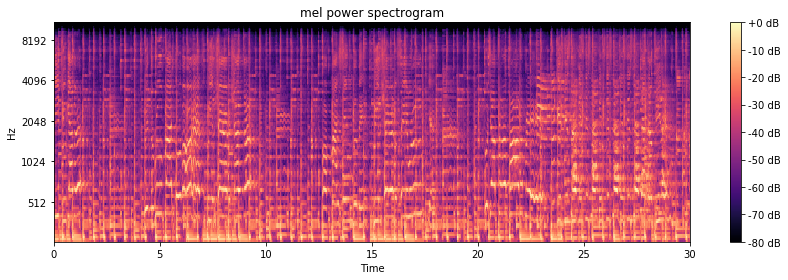

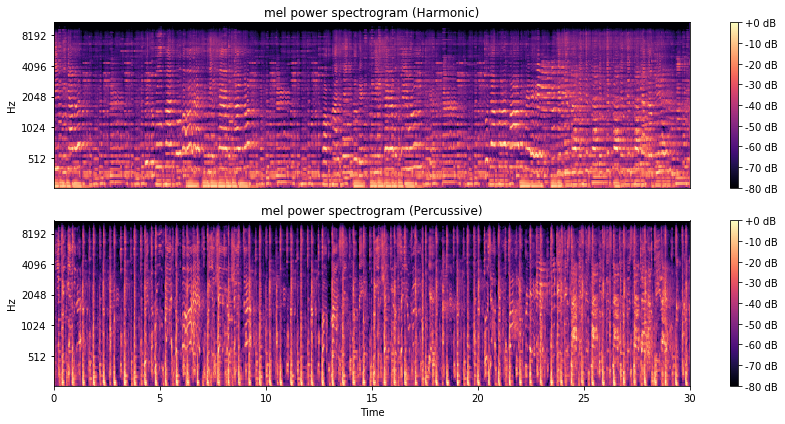

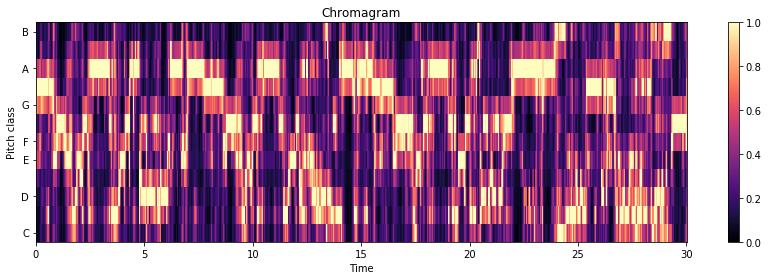

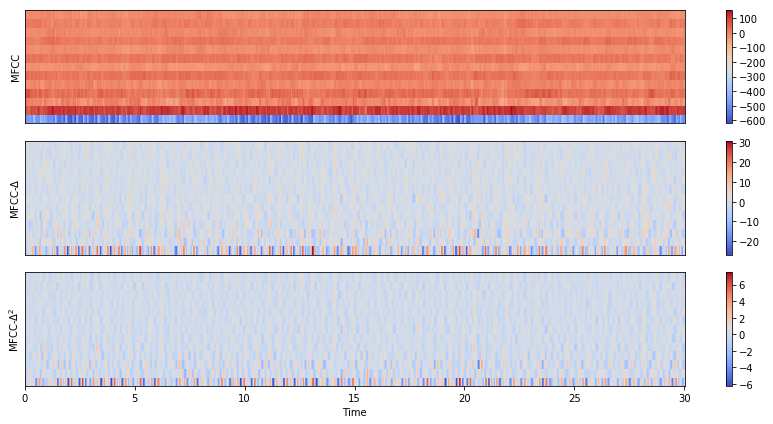

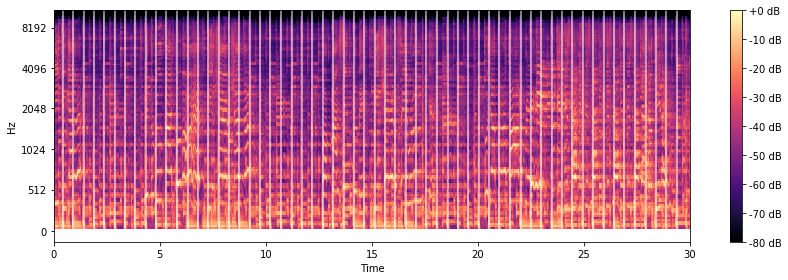

Estimated tempo:        123.05 BPM
First 5 beat frames:    [ 18  40  61  82 103]
First 5 beat times:     [ 0.41795918  0.92879819  1.41641723  1.90403628  2.39165533]
label reggae number 00000
features size (63, 60, 41, 2)
labels size (63,)
32/63 [==============>...............] - ETA: 0sPrediction Value [8 8 8 8 8 8 8 3 8 8 8 8 8 8 8 8 2 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 0
 4 8 8 8 8 8 8 8 8 8 8 8 8 8 0 9 8 8 8 8 8 8 3 8 8 8]
['blues', 'classical', 'country', 'disco', 'hiphop', 'jazz', 'metal', 'pop', 'reggae', 'rock']
Counter Elements Counter({8: 56, 0: 2, 3: 2, 2: 1, 4: 1, 9: 1})


In [24]:
audio_path = 'gtzan/wav/reggae.00000.wav'
show_mel_spectogram(audio_path)
show_harmonic_percussive_separation(audio_path)
show_pitch_chromagram(audio_path)
show_mfcc_textures(audio_path)
show_beat_tracking(audio_path)
predict(audio_path)

## Rock Sample

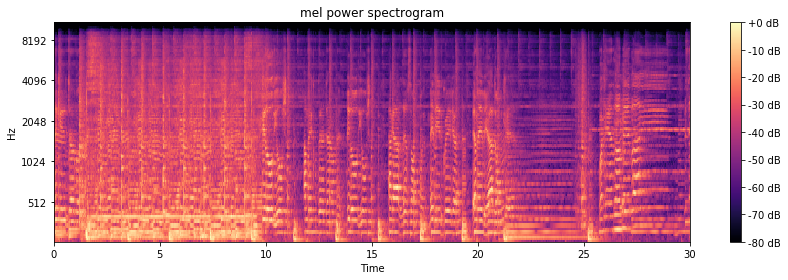

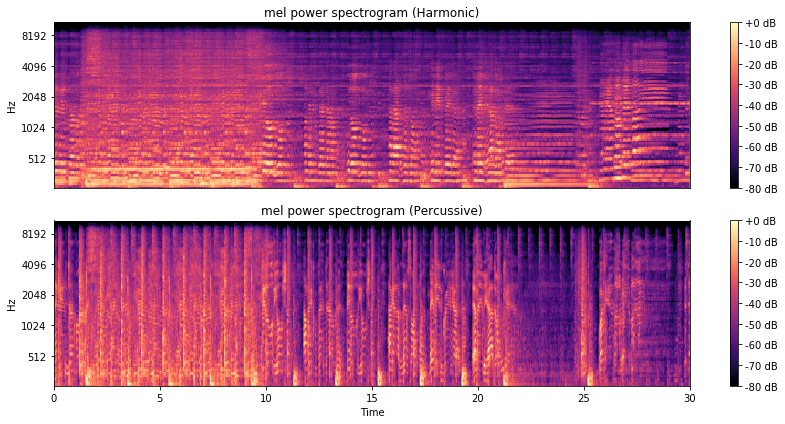

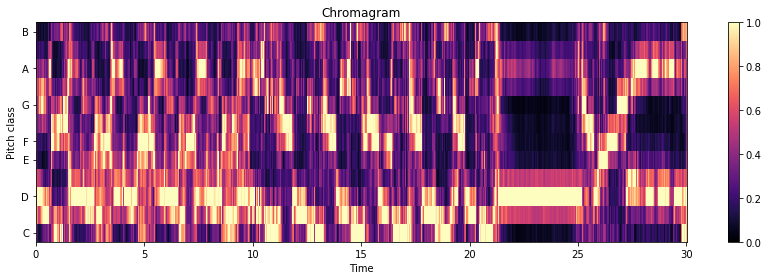

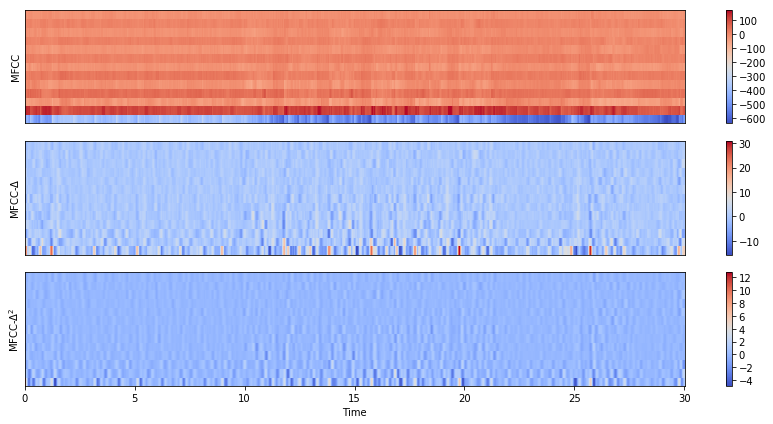

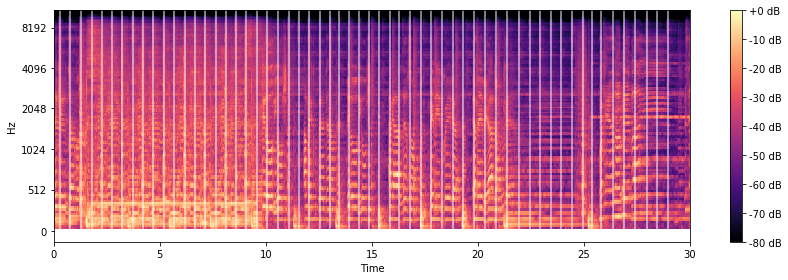

Estimated tempo:        123.05 BPM
First 5 beat frames:    [12 33 55 77 98]
First 5 beat times:     [ 0.27863946  0.7662585   1.27709751  1.78793651  2.27555556]
label rock number 00000
features size (63, 60, 41, 2)
labels size (63,)
32/63 [==============>...............] - ETA: 0sPrediction Value [9 9 0 9 9 9 9 9 9 9 9 9 9 9 0 9 9 9 9 0 9 9 9 0 9 9 9 0 9 9 9 9 9 0 9 9 9
 9 9 9 2 0 5 9 9 3 2 9 9 9 9 9 5 5 9 9 9 9 9 9 9 9 9]
['blues', 'classical', 'country', 'disco', 'hiphop', 'jazz', 'metal', 'pop', 'reggae', 'rock']
Counter Elements Counter({9: 50, 0: 7, 5: 3, 2: 2, 3: 1})


In [25]:
audio_path = 'gtzan/wav/rock.00000.wav'
show_mel_spectogram(audio_path)
show_harmonic_percussive_separation(audio_path)
show_pitch_chromagram(audio_path)
show_mfcc_textures(audio_path)
show_beat_tracking(audio_path)
predict(audio_path)